In [4]:
#import nltk
import os
import pandas as pd
from nltk import ngrams, FreqDist

In [5]:
corpus_files = sorted(os.listdir('corpora'))
print(corpus_files)

['entertainment_anime.txt', 'lifestyle_food.txt', 'news_conservative.txt']


In [6]:
def tokenise(corpus):
    """Really dumb tokeniser. Splits to sentences and then to words. """
    sentences = []
    for sentence in corpus.split('\n'):
        sentence = sentence.strip()
        if len(sentence) > 0:
            sentences.append([x.strip() for x in sentence.split(' ') if len(x) > 0])
    return sentences

def get_unigrams(corpus):
    unigrams = {}
    for sentence in corpus:
        for word in sentence:
            word = word.lower()
            if len(word) > 0:
                if word not in unigrams:
                    unigrams[word] = 0
                unigrams[word] += 1
    return unigrams

def get_ngrams(corpus):
    ngrms = {}
    for sentence in corpus:
        ngs = ngrams(sentence, 3)
        for ng in ngs:
            if ng not in ngrms:
                ngrms[ng] = 0
            ngrms[ng] += 1
    return ngrms

def sort_dict(d, reverse = True):
    return sorted(d.items(), key = lambda x : x[1], reverse = reverse)

In [7]:
corpora = {f : tokenise(open('corpora/'+f).read()) for f in corpus_files}
#all_unigrams = {cls : get_unigrams(corpus) for cls, corpus in corpora.items()}

all_unigrams = {cls : get_ngrams(corpus) for cls, corpus in corpora.items()}
# print("Class/Genre Tokens Types")
# for cls, corpus in corpora.items():
#     print(cls, len(corpus), len(all_unigrams[cls]))

all_unigrams = pd.DataFrame(all_unigrams)
all_unigrams

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: DeprecationWarning: generator 'ngrams' raised StopIteration


entertainment_anime.txt  \
0          1                   0079                                                        50.0   
                               acguy                                                       50.0   
                               gelgoog                                                     50.0   
                               zeong                                                       50.0   
           3                   rick                                                        50.0   
           4                   zgok                                                        50.0   
           42amp               o                                                           50.0   
           6                   zaku                                                        50.0   
           9                   dom                                                         50.0   
           aamp                c                                                           50.0   
           consequenceszombies for                                                         48.0   
           episode             2                                                           99.0   
                               4                                                           49.0   
           not                 sure                                                        50.0   
           note                episode                                                     50.0   
           ova                 2                                                           50.0   
                               is                                                          50.0   
           provided            to                                                          50.0   
           s                   keima                                                       50.0   
           sense               go                                                          50.0   
           was                 put                                                         50.0   
00         and                 seed                                                        50.0   
           patlabor            was                                                         50.0   
           seirei              no                                                          50.0   
0079       and                 does                                                        50.0   
           is                  not                                                         50.0   
                               one                                                         50.0   
           it                  s                                                           50.0   
           looks               like                                                        50.0   
           na                  misc                                                        50.0   
...                                                                                         ...   
zeta       in                  two                                                         50.0   
           my                  personal                                                    50.0   
           now                 as                                                          50.0   
           or                  at                                                          50.0   
           over                all                                                         50.0   
           since               it                                                          50.0   
           will                fill                                                        50.0   
zetsubou   sensei              3                                                           50.0   
                               https                                                       50.0   
zetsuen    no

In [8]:
all_unigrams = all_unigrams.fillna(0.0) # I am not Smoothing.
sum_counts = all_unigrams.sum(axis = 1).sort_values(ascending = False)
sum_counts

i           do                  nt            5705.0
https       wwwyoutubecomwatch  v             4876.0
a           lot                 of            3542.0
one         of                  the           2886.0
i           m                   not           2225.0
spice       and                 wolf          2147.0
it          s                   a             1998.0
do          nt                  know          1948.0
i           did                 nt            1759.0
it          s                   not           1718.0
to          be                  a             1590.0
i           ca                  nt            1566.0
named       after               the           1470.0
but         it                  s             1465.0
i           ve                  been          1310.0
but         i                   m             1297.0
this        is                  a             1276.0
i           ve                  seen          1216.0
            have                nt            

In [9]:
all_unigrams = all_unigrams.reindex(sum_counts.index)
all_unigrams

,,,entertainment_anime.txt,lifestyle_food.txt,news_conservative.txt
i,do,nt,4227.0,250.0,1228.0
https,wwwyoutubecomwatch,v,4719.0,100.0,57.0
a,lot,of,2740.0,300.0,502.0
one,of,the,2240.0,200.0,446.0
i,m,not,1795.0,150.0,280.0
spice,and,wolf,2147.0,0.0,0.0
it,s,a,1249.0,299.0,450.0
do,nt,know,1248.0,250.0,450.0
i,did,nt,1597.0,50.0,112.0
it,s,not,1276.0,50.0,392.0


In [10]:
import cufflinks as cf
cf.go_offline()

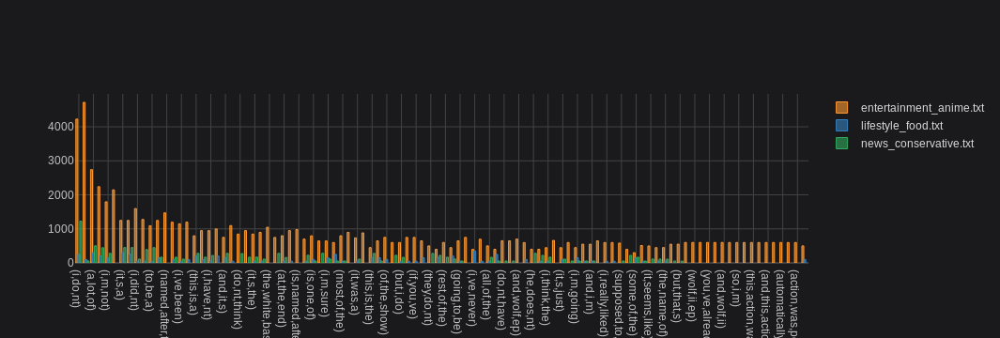

In [11]:
all_unigrams[:100].iplot(kind='bar')

In [12]:
print(all_unigrams.sum())

entertainment_anime.txt    3709630.0
lifestyle_food.txt          492374.0
news_conservative.txt       971109.0
dtype: float64


In [13]:
# Laplace Smoothing
all_unigrams = all_unigrams + 1
all_unigrams.sum()

entertainment_anime.txt    3798972.0
lifestyle_food.txt          581716.0
news_conservative.txt      1060451.0
dtype: float64

In [14]:
# Convert to Probabilites
all_unigrams_probs = all_unigrams/all_unigrams.sum()
all_unigrams_probs

,,,entertainment_anime.txt,lifestyle_food.txt,news_conservative.txt
i,do,nt,1.112933e-03,0.000431,1.158941e-03
https,wwwyoutubecomwatch,v,1.242441e-03,0.000174,5.469371e-05
a,lot,of,7.215110e-04,0.000517,4.743265e-04
one,of,the,5.898964e-04,0.000346,4.215188e-04
i,m,not,4.727595e-04,0.000260,2.649816e-04
spice,and,wolf,5.654161e-04,0.000002,9.429950e-07
it,s,a,3.290364e-04,0.000516,4.252907e-04
do,nt,know,3.287732e-04,0.000431,4.252907e-04
i,did,nt,4.206401e-04,0.000088,1.065584e-04
it,s,not,3.361436e-04,0.000088,3.705970e-04


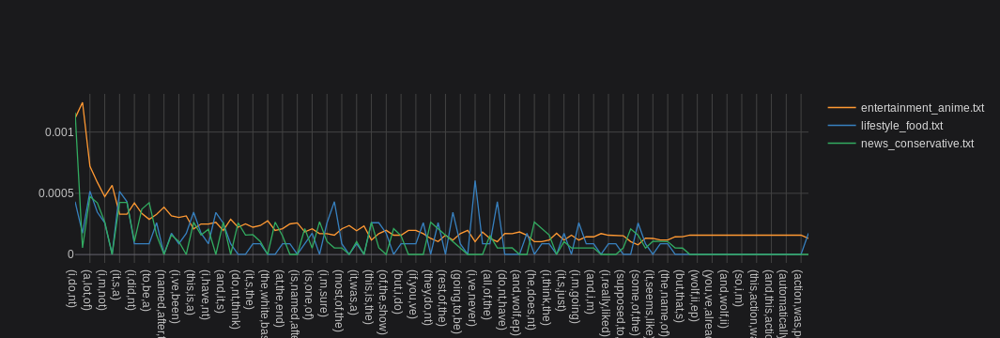

In [15]:
all_unigrams_probs[:100].iplot()

In [16]:
import math
all_unigrams_log = all_unigrams_probs.applymap(math.log)

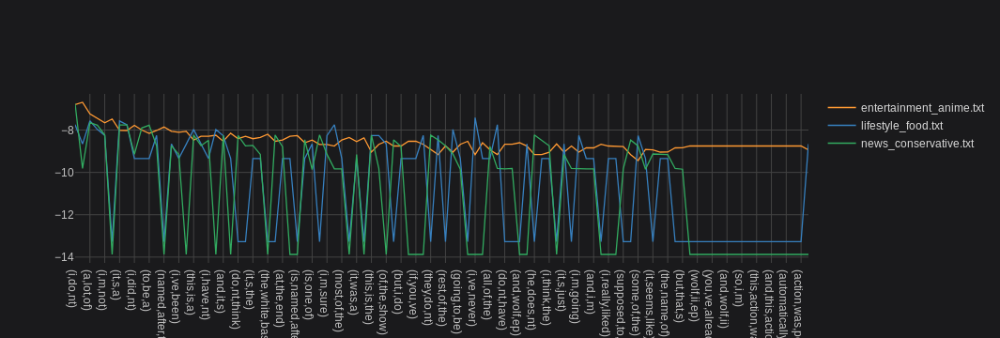

In [17]:
all_unigrams_log[:100].iplot()

In [28]:
def sentence_prob(sentence):
    wordprobs = all_unigrams_log.loc[list(sentence) + ['this is a'.split()]] 
    #print(wordprobs)
    return wordprobs.sum()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike



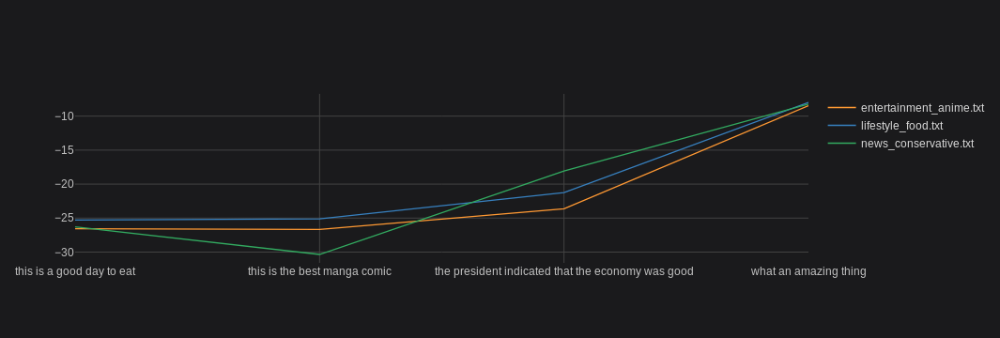

In [31]:
sentences = ["this is a good day to eat", "this is the best manga comic","the president indicated that the economy was good", "what an amazing thing"]
ngs = list(ngrams(sentences[0].split(' '), 3))
sprobs = pd.DataFrame({sentence : sentence_prob(ngrams(sentence.split(' '),3)) for sentence in sentences})
sprobs.transpose().iplot()

## We have
$$ P(word\,|\,class) = \frac{c(word\,in\,class)}{c(all\,words\,in\,that\,class)}$$
## What we need
$$ P(class\,|\,word) $$
$$ \rightarrow \frac{P(word\,|\,class) * P(class)}{P(word)} $$
## How to choose a class ?
$$class = argmax_i\,P(class_i\,|\,word)$$
$$ \rightarrow argmax_i \, \frac{P(word\,|\,class_i) * P(class_i)}{P(word)} $$
$$ \rightarrow argmax_i \, P(word\,|\,class_i) * P(class_i) $$

In [93]:
cprobs = all_unigrams.sum()
cprobs = cprobs / cprobs.sum()
cprobs = cprobs.apply(math.log)

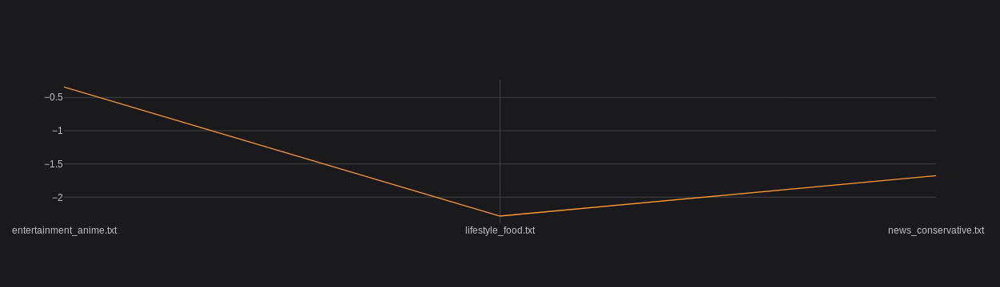

In [94]:
cprobs.iplot()

#### Skew in the Classes
* What if one class/genre has the biggest corpus ?.
* How to manage this skew ?

In [95]:
def nbestimate(sentence):
    probs = all_unigrams_log.loc[sentence].sum()
    probs = probs + cprobs
    return probs


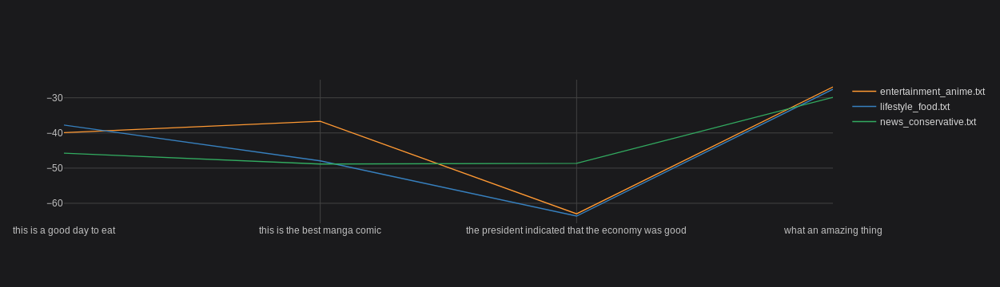

In [96]:
sprobs = pd.DataFrame({sentence : nbestimate(sentence.split(' ')) for sentence in sentences})
sprobs.transpose().iplot()

### Generative : A Class of Models 
* $P(Class\,|\,Data)$ is estimated by figuring out $P(Data\,|\,Class)$
* The model tries to ask, What is the chance that, I have seen this data if it came from this particular class ?.
* The model therefore, **generates** data, or more accurately, generates its estimate of the data. So, its a

entertainment_anime.txt ['in', 'law', 'school', 'we', 'had', 'a', 'course', 'of', 'international', 'law', 'and', 'the', 'subject', 'was', 'about', 'ongoing', 'war', 'we', 'had', 'to', 'argue', 'which', 'side', 'of', 'the', 'war', 'was', 'more', 'correct', 'for', 'waging', 'war', 'and', 'when', 'it', 'was', 'my', 'turn', 'i', 'told', 'them', 'that', 'either', 'were', 'false', 'and', 'preached', 'madara', 's', 'and', 'nagato', 's', 'speech', 'in', '5', 'mins', 'or', 'something', 'passed', 'the', 'course', 'and', 'got', 'mad', 'respect', 'from', 'everyone', 'for', 'my', 'wisdom']
                                  0
entertainment_anime.txt -482.243646
lifestyle_food.txt      -549.529321
news_conservative.txt   -511.783908


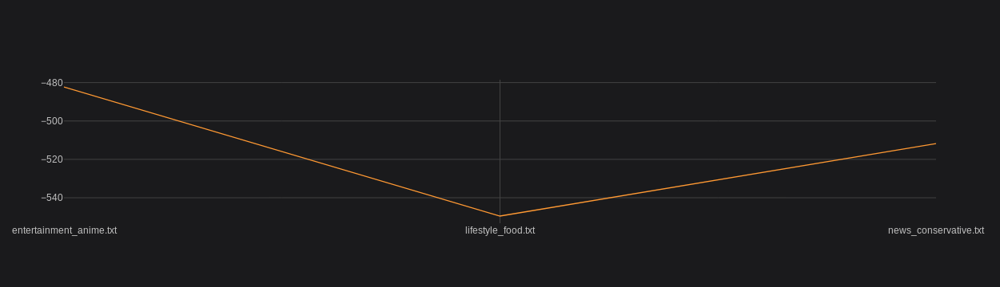

lifestyle_food.txt ['did', 'you', 'use', 'a', 'glaze', 'if', 'so', 'what', 'did', 'you', 'use']
                                 0
entertainment_anime.txt -74.006561
lifestyle_food.txt      -63.721030
news_conservative.txt   -74.426615


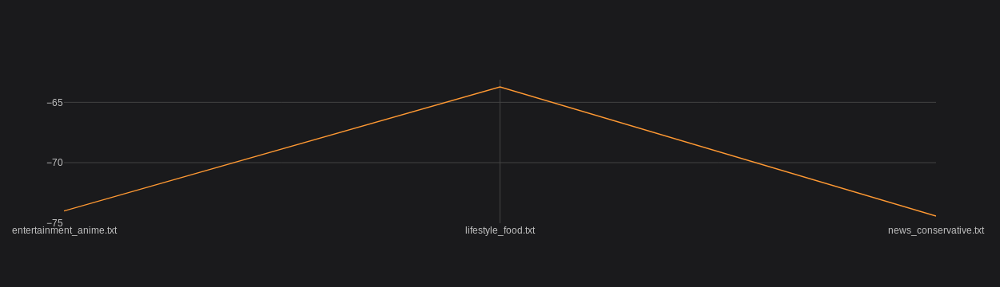

news_conservative.txt ['i', 'trust', 'the', 'tap', 'water', 'in', 'flint', 'or', 'wearing', 'white', 'shorts', 'after', 'eating', 'taco', 'bell', 'more', 'than', 'that', 'hag']
                                  0
entertainment_anime.txt -177.324280
lifestyle_food.txt      -161.679539
news_conservative.txt   -144.023426


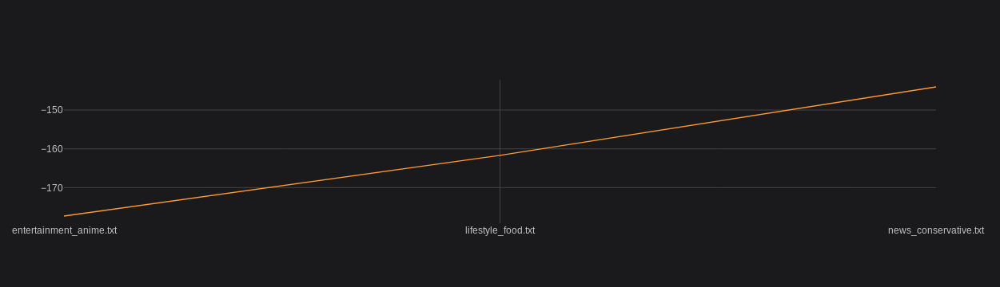

In [103]:
import random
for cls, sentences in corpora.items():
    clen = len(corpora[cls])
    rsentence = corpora[cls][random.randrange(clen)]
    print(cls, rsentence)
    nbprobs = pd.DataFrame(nbestimate(rsentence))
    print(nbprobs)
    nbprobs.iplot()
#     nprobs[auth] = nbprobs
#     iplot([ 
#         Scatter({"x" : list(zip(*nbprobs))[0], "y": list(zip(*nbprobs))[1]}, name=auth) 
#     ])
# iplot([ 
#     Bar({"x" : list(zip(*D))[0], "y": list(zip(*D))[1]}, name=auth) for auth, D in nprobs.items()
# ])

In [160]:
import numpy
def generate(cls, length = 10):
    probs = all_unigrams_probs[cls]
    words = numpy.random.multinomial(length, probs.values)
    return list(all_unigrams_probs.loc[words > 0].index)

In [163]:
wordbags = {cls  : generate(cls) for cls in all_unigrams.columns}
wordbags


{'entertainment_anime.txt': ['and',
  'it',
  'that',
  'was',
  'have',
  'me',
  'know',
  'remember',
  'newtypes',
  'synopses'],
 'lifestyle_food.txt': ['the',
  'of',
  'is',
  'that',
  'as',
  'years',
  'cut',
  'wwwredditcomrfoodporncomments3j7iyhpesto_chicken_sandwiches_with_fontina_mayonnaise',
  'fatty'],
 'news_conservative.txt': ['it',
  'you',
  'but',
  'he',
  'support',
  'wealth',
  'bias',
  'supported',
  'surprisingly',
  'commandments']}